# Projects in AI and ML HW 5

In [ ]:
# same deal for gdrive and kaggle
from google.colab import drive
drive.mount('/content/drive')

!rm -r ~/.kaggle
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/.kaggle/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!pip install -q kaggle


# download 

Mounted at /content/drive
rm: cannot remove '/root/.kaggle': No such file or directory


## Task 1 (70 points):


In your project, you will pick an image dataset to solve a classification task. Provide a link to
your dataset.

Chosen dataset: https://www.kaggle.com/datasets/gpiosenka/butterfly-images40-species

I am using this dataset for buttefly species image classification. I chose this dataset because it has a reasonable size and an interesting problem that could be hard (at least I think it is)

In [ ]:
%load_ext tensorboard


### Part 1 (20 points): 
This step involves downloading, preparing, and visualizing your dataset. 
Create a convolutional base using a common pattern: a stack of Conv and MaxPooling layers. 
Depending on the problem and the dataset you must decide what pattern you want to use (i.e., how many Conv layers and how many pooling layers).
Please describe why you chose a particular pattern. Add the final dense layer(s).
Compile and train the model. Report the final evaluation and describe the metrics.


In [ ]:
# install dataset and unzip

!rm -r dataset
!kaggle datasets download -d gpiosenka/butterfly-images40-species
!mkdir dataset
!unzip -qq butterfly-images40-species.zip -d dataset

rm: cannot remove 'dataset': No such file or directory
 98% 358M/365M [00:01<00:00, 241MB/s]
100% 365M/365M [00:01<00:00, 228MB/s]


I chose a classic Conv network design with one or more conv conv layers, each with dropout and maxpooling and a linear layer at the end. I chose this pattern pattern because the dropout and maxpooling allows the model to prevent overfitting, and the final linear layer is used for transforming the conv outputs for prediction.

I wanted to try larger networks, but I was not able to create networks that were too large on colab. (I actually had to purchase premium to run the 2 conv version....)

In [ ]:
# loading the dataset
from pathlib import Path
from torch import tensor
from torchvision.io import read_image
from torch.utils.data import Dataset,DataLoader
import torchvision.transforms as T


DATASET_BASE = Path('dataset')
# first prep labels
LABEL_TO_NUM = {species.stem:i for i,species in enumerate(sorted((DATASET_BASE/'train').glob('*')))}
NUM_TO_LABEL = dict(zip(LABEL_TO_NUM.values(),LABEL_TO_NUM.keys()))
IMG_SHAPE = (80,80)


class ButterflyDataset(Dataset):

    def __init__(self, prefix):
        resize = T.Resize(IMG_SHAPE)
        data = []
        for species in (DATASET_BASE / prefix).glob('*'):
            for impath in species.glob('*.jpg'):
                img = resize(read_image(str(impath)))/255
                img_cuda = img.cuda()
                del img
                data.append(
                    {
                        'im': img_cuda,
                        'label': tensor(LABEL_TO_NUM[species.stem]).long().cuda(),
                        'impath': impath
                    }
                )
        self.data = data
        # self.data = [
        #     {'im':(resize(read_image(str(im)))/255).cuda(),'label':tensor(LABEL_TO_NUM[species.stem]).long().cuda(),'impath':im}
        # ]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]['im'],self.data[idx]['label']

train_data = ButterflyDataset('train') 
valid_data = ButterflyDataset('valid') 
test_data = ButterflyDataset('test') 

ADONIS


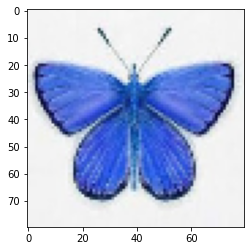

In [ ]:
# take a look at pictures

import matplotlib.pyplot as plt

for im,lab in train_data:
    if lab == 0: break

plt.imshow(T.functional.to_pil_image(im))
print(NUM_TO_LABEL[lab.item()])

AFRICAN GIANT SWALLOWTAIL


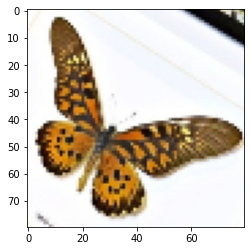

In [ ]:
for im,lab in train_data:
    if lab == 1: break

plt.imshow(T.functional.to_pil_image(im))
print(NUM_TO_LABEL[lab.item()])

AMERICAN SNOOT


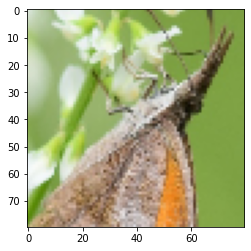

In [ ]:
for im,lab in train_data:
    if lab == 2: break

plt.imshow(T.functional.to_pil_image(im))
print(NUM_TO_LABEL[lab.item()])

In [ ]:
train_data[0][0].shape

torch.Size([3, 80, 80])

In [ ]:
import torch
from torch import nn, optim
import torch.nn.functional as F
from tqdm.auto import tqdm

from torch.utils.tensorboard import SummaryWriter

BATCH_SIZE = 32

train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
valid_loader = DataLoader(valid_data, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=True)

TENSORBOARD_PATH = Path('/content/drive/MyDrive/tensorboard/projects-in-ml-hw5')


@torch.no_grad()
def score(model,loader):
    model.eval()
    y_reals = []
    y_preds = []
    for X,y in loader:
        y_reals.append(y)
        y_preds.append(model(X).argmax(1))
    y_reals,y_preds = torch.hstack(y_reals),torch.hstack(y_preds)
    model.train()
    return (y_reals == y_preds).float().mean()

class ConvNet(nn.Module):
    def __init__(
            self,
            conv_shapes=[16,32],
            kernel_sizes=[3,3],
            fc_scales=[0.7],
            dropout=.1,
            learning_rate = 1e-4,
            weight_decay = 1e-4,
        ):
        if len(conv_shapes) != len(kernel_sizes): return

        super(ConvNet, self).__init__() 
        conv_setup = [3, *conv_shapes]
        self.conv_layers = nn.Sequential(*[
            nn.Sequential(
                nn.Conv2d(conv_setup[i], c, kernel_size=k,padding='same'), 
                nn.BatchNorm2d(c),
                # # https://discuss.pytorch.org/t/whats-the-difference-between-nn-relu-and-nn-relu-inplace-true/948
                # nn.LeakyReLU(negative_slope = 0.01, inplace=True),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(2, 2), # makes output shape /2 /2
            )
            for i,(c,k) in enumerate(zip(conv_setup[1:],kernel_sizes))
        ],
            nn.Dropout(dropout,inplace=True) 
        )
        output_shape = conv_shapes[-1] * IMG_SHAPE[0] * IMG_SHAPE[1]
        for _ in conv_setup[1:]: output_shape /= 4

        fc_setup = [int(output_shape*sc)
                    for sc in [1, *fc_scales]]

        self.fc_layers = nn.Sequential(*[
            nn.Sequential(
                nn.Linear(fc_setup[i],s,bias=True),
                nn.ReLU(inplace=True)
            )
            for i,s in enumerate(fc_setup[1:])
        ],
            nn.Linear(fc_setup[-1], len(LABEL_TO_NUM), bias=True),
        )
        self.name='ConvNet'

        self.learning_rate = learning_rate
        self.weight_decay = weight_decay
        self.prefix = f'ConvNet_{conv_shapes}_{kernel_sizes}_{fc_scales}_{dropout}_{learning_rate}_{weight_decay}'

    def forward(self, x):
        x = self.conv_layers(x).flatten(1)
        x = self.fc_layers(x)
        x = F.softmax(x,dim=1)
        return x 


def fit(
    model,
    train_loader,
    valid_loader,
    test_loader,
    n_iter = 100,
    prefix=''
):
    loss_op = nn.CrossEntropyLoss().cuda()
    optimizer = optim.Adam(model.parameters(),lr=1e-3,weight_decay=1e-4)

    writer = SummaryWriter(log_dir=str(TENSORBOARD_PATH/prefix),flush_secs=1)
    for epoch in tqdm(range(n_iter),leave=False):
        model.train()
        epoch_losses = []
        for X,y in train_loader:
            optimizer.zero_grad()
            out = model(X)
            loss = loss_op(out,y)
            loss.backward()
            optimizer.step()

            epoch_losses.append(loss.item())
        # print(self.score(train_loader))
        # evaluate every 10 epochs
        # if epoch % 10 == 0 and epoch > 0:
        writer.add_scalar('Train/Loss', sum(epoch_losses), epoch)
        writer.add_scalar('Train/Accuracy', score(model,train_loader), epoch)
        writer.add_scalar('Valid/Accuracy', score(model,valid_loader), epoch)
    


    writer.flush()
    writer.close()
    print(f'Final test accuracy: {score(model,test_loader)}')
    return model

In [ ]:
%tensorboard --logdir="/content/drive/MyDrive/tensorboard/projects-in-ml-hw5" --bind_all

Reusing TensorBoard on port 6006 (pid 1523), started 0:29:15 ago. (Use '!kill 1523' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# train the stuff

default_setting = {
    'conv_shapes': [16,32],
    'kernel_sizes': [3,3],
    'fc_scales': [0.7],
    'dropout':.1,
    'learning_rate': 1e-3,
    'weight_decay': 1e-4,
}

n_iter = 500

run_settings = [
    {
        # one conv, one fc
        **default_setting,
        'conv_shapes':[16],
        'kernel_sizes': [3],
        'fc_scales': []
    },
    {
        # Additional linear layer
        **default_setting,
        'conv_shapes':[16],
        'kernel_sizes': [3],
    },
    # default: additional conv layer
    default_setting,
    {
        # bigger conv
        **default_setting,
        'fc_scales': []
    },
    {
        # smaller conv
        **default_setting,
        'conv_shapes':[16,16],
        'kernel_sizes': [3,3],
        'fc_scales': []
    },
    {
        # larger kernel
        **default_setting,
        'conv_shapes':[16,32],
        'kernel_sizes': [7,7],
        'fc_scales': []
    },
    {
        # bigger fv
        **default_setting,
        'conv_shapes':[16,32],
        'kernel_sizes': [3,3],
        'fc_scales': []
    }

]

# for setting in run_settings:




In [ ]:
m = ConvNet(**run_settings[0]).cuda()
m = fit(m,train_loader,valid_loader,test_loader,n_iter=n_iter,prefix=m.prefix)
del m

  0%|          | 0/500 [00:00<?, ?it/s]

Final test accuracy: 0.36266666650772095


In [ ]:
m = ConvNet(**run_settings[1]).cuda()
m = fit(m,train_loader,valid_loader,test_loader,n_iter=n_iter,prefix=m.prefix)
del m

  0%|          | 0/500 [00:00<?, ?it/s]

Final test accuracy: 0.1653333306312561


In [ ]:
m = ConvNet(**run_settings[2]).cuda()
m = fit(m,train_loader,valid_loader,test_loader,n_iter=n_iter,prefix=m.prefix)
del m

  0%|          | 0/500 [00:00<?, ?it/s]

Final test accuracy: 0.2773333191871643


In [ ]:
m = ConvNet(**run_settings[3]).cuda()
m = fit(m,train_loader,valid_loader,test_loader,n_iter=n_iter,prefix=m.prefix)
del m

  0%|          | 0/500 [00:00<?, ?it/s]

Final test accuracy: 0.5946666598320007


In [ ]:
m = ConvNet(**run_settings[4]).cuda()
m = fit(m,train_loader,valid_loader,test_loader,n_iter=n_iter,prefix=m.prefix)
del m

  0%|          | 0/500 [00:00<?, ?it/s]

Final test accuracy: 0.5333333015441895


In [ ]:
# Best valid performance!

m = ConvNet(**run_settings[5]).cuda()
m = fit(m,train_loader,valid_loader,test_loader,n_iter=n_iter,prefix=m.prefix)
del m

  0%|          | 0/500 [00:00<?, ?it/s]

Final test accuracy: 0.6240000128746033


In [ ]:
# pretty close to best, second best!

m = ConvNet(**run_settings[6]).cuda()
m = fit(m,train_loader,valid_loader,test_loader,n_iter=n_iter,prefix=m.prefix)
del m

  0%|          | 0/500 [00:00<?, ?it/s]

Final test accuracy: 0.6026666760444641


Tensorboard link: https://tensorboard.dev/experiment/dnKgRkBiR3W314OA9Ld9Mg/

### Part 2 (25 points): 
The following models are widely used for transfer learning because of their performance and architectural innovations:

1. VGG (e.g., VGG16 or VGG19).
2. GoogLeNet (e.g., InceptionV3).
3. Residual Network (e.g., ResNet50).
4. MobileNet (e.g., MobileNetV2)

Choose any one of the above models to perform the classification task you did in Part 1.
Evaluate the results using the same metrics as in Part 1. Are there any differences? Why or why not?

The pretrained model worked much better even with a much smaller number of epochs. This may be due to the fact that the conv weights are nicely settled from pretraining.

In my model's case, I had trouble making a larger network because the RAM would run out even for 2 layers of convolution

In [ ]:
import torchvision
from torch import nn
model = torchvision.models.mobilenet_v2(weights='DEFAULT',progress=True)

# switch out last layer

model.classifier[1] = nn.Linear(1280, len(NUM_TO_LABEL))

# it learns super quickly!
m = fit(model.cuda(),train_loader,valid_loader,test_loader,n_iter=20,prefix='mobilenet_v2')
del m

  0%|          | 0/20 [00:00<?, ?it/s]

Final test accuracy: 0.8880000114440918


### Part 3 (25 points): 

Use data augmentation to increase the diversity of your dataset by applying random transformations such as image rotation (you can use any other technique as well). 
Repeat the process from part 1 with this augmented data. Did you observe any difference in results?

I applied random (p=0.5) horizontal and vertical flips to my images. The performance of the model actually seemed to drop. I suspect that this has to do with the lack of training data, and that it may work better if all versions (original, horizontal flip, vertical flip) were included in the training data. I was not able to do this because of computational limits

In [ ]:

class AugmentedButterflyDataset(Dataset):

    def __init__(self, dataset):
        flip_hori = T.RandomHorizontalFlip()
        flip_verti = T.RandomVerticalFlip()
        data = []
        # for species in (DATASET_BASE / prefix).glob('*'):
        #     for impath in species.glob('*.jpg'):
        for img,label in dataset:
            data += [
                {
                    'im': flip_verti(flip_hori(img)),
                    'label': label,
                    # 'impath': impath
                }
            ]
        self.data = data
        # self.data = [
        #     {'im':(resize(read_image(str(im)))/255).cuda(),'label':tensor(LABEL_TO_NUM[species.stem]).long().cuda(),'impath':im}
        # ]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]['im'],self.data[idx]['label']

# train_data = AButterflyDataset('train')
train_loader_aug = DataLoader(AugmentedButterflyDataset(train_data), batch_size=BATCH_SIZE, shuffle=True)


In [ ]:
# test out the best 2 from before


m = ConvNet(**run_settings[5]).cuda()
m = fit(m,train_loader_aug,valid_loader,test_loader,n_iter=n_iter,prefix=f'aug_{m.prefix}')
del m


m = ConvNet(**run_settings[6]).cuda()
m = fit(m,train_loader_aug,valid_loader,test_loader,n_iter=n_iter,prefix=f'aug_{m.prefix}')
del m

  0%|          | 0/500 [00:00<?, ?it/s]

Final test accuracy: 0.5146666765213013


  0%|          | 0/500 [00:00<?, ?it/s]

Final test accuracy: 0.5759999752044678


The saved tensorboard can be accessed at: https://tensorboard.dev/experiment/RroszkgDROmPJbqBVyBIEg/#scalars


In [ ]:
!tensorboard dev upload \
  --logdir "/content/drive/MyDrive/tensorboard/projects-in-ml-hw5" \
  --name "Projects in AI and ML HW 5 Task 1" \
  --one_shot


***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

/content/drive/MyDrive/tensorboard/projects-in-ml-hw5

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=openid+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fuserinfo.email&state=VcVAxvA7sRXLfssvTezpQs25G

## Task 2 (30 points):


For this task, I chose a celebA dataset. I chose this dataset because it is already nicely parsed to 28x28 images, and has been proven to be a useful dataset in past research


In [ ]:
!rm -rf task2_data
!mkdir task2_data
!unzip -qq /content/drive/MyDrive/projects-in-ml-hw5/celeb.zip -d task2_data

### Part 1 (15 points): 
Variational Autoencoder (VAE): Here is a complete implementation of a VAE in TensorFlow: https://www.tensorflow.org/tutorials/generative/cvae
Following these steps try generating images using the same encoder-decoder architecture using a different Image dataset (other than MNIST).

In [ ]:
import torchvision.transforms as T
from torch.utils.data import Dataset,DataLoader
import pandas as pd
from pathlib import Path
import PIL

partition_df = pd.read_csv('task2_data/list_eval_partition.csv')
partition_names = {
    'train':0,
    'valid':1,
    'test':2,
}

IMG_BASE = Path('task2_data/img_align_celeba/img_align_celeba')
IMG_SIZE = 64

transform = T.Compose([
    T.ToTensor(),
    T.Resize((IMG_SIZE,IMG_SIZE))

])

class CelebA(Dataset):
    def __init__(self,split ='train'):
        self.img_files = partition_df[partition_df.partition==partition_names[split]].image_id.apply(lambda x: str(IMG_BASE/x)).values
    def __len__(self):
        return len(self.img_files)
    def __getitem__(self,idx):
        return transform(PIL.Image.open(self.img_files[idx]).crop((0, 20, 178, 198)))

batch_size = 128

train_loader = DataLoader(CelebA('train'),batch_size=batch_size,shuffle=True)
test_loader = DataLoader(CelebA('test'),batch_size=1,shuffle=False)

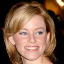

In [ ]:
for img in train_loader: break
T.functional.to_pil_image(img[0])

I basically followed the same structure as the tensorflow guide. But I had to change the shapes a bit to make it work with the images I'm using

In [ ]:
import torch
from torch import nn,tensor
import torch.nn.functional as F

class CVAE(nn.Module):
    def __init__(self,latent_dim,device='cuda'):
        super(CVAE,self).__init__()
        self.device = device
        self.latent_dim = latent_dim

        self.encoder = nn.Sequential(
            nn.Conv2d(3,32,3,stride=2),
            nn.ReLU(True),
            nn.Conv2d(32,64,3,stride=2),
            nn.Flatten(),
            # final shape after conv
            nn.Linear(64*15*15,latent_dim*2)
        )

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim,32*10*10),
            nn.Unflatten(1,(32,10,10)),
            nn.ConvTranspose2d(32,64,3,stride=2),
            nn.ReLU(True),
            nn.ConvTranspose2d(64,32,3,stride=2),
            nn.ReLU(True),
            nn.ConvTranspose2d(32,3,3,stride=2),
            # ensure shape is same as input
            T.Resize((IMG_SIZE,IMG_SIZE)),
        )

        self.to(device)

    def sample(self,eps=None):
        if eps is None:
            eps = torch.normal(0,1,(100,self.latent_dim)).to(self.device)
        return self.decode(eps,apply_sigmoid=True)

    def encode(self,x):
        o = self.encoder(x)
        mean = o[:,:self.latent_dim]
        logvar = o[:,self.latent_dim:]
        return mean,logvar
    
    def reparameterize(self,mean,logvar):
        eps = torch.normal(0,1,mean.shape).to(self.device)
        return eps * torch.exp(logvar * .5) + mean
    
    def decode(self, z, apply_sigmoid = False):
        logits = self.decoder(z)
        if apply_sigmoid:
            return F.sigmoid(logits)
        return logits

log2pi = torch.log(tensor(2 * torch.pi))
def log_normal_pdf(sample,mean,logvar,raxis=1):
    return (-.5 * ((sample-mean)**2 * torch.exp(-logvar) + logvar + log2pi)).sum(axis=raxis)


def compute_loss(model, x):
    x = x.cuda()
    model.train()
    mean, logvar = model.encode(x)
    z = model.reparameterize(mean, logvar)
    x_logit = model.decode(z)
    cross_ent = F.binary_cross_entropy_with_logits(x_logit, x,reduction='none')
    logpx_z = -cross_ent.sum(dim=[1, 2, 3])
    logpz = log_normal_pdf(z, tensor(0), tensor(0))
    logqz_x = log_normal_pdf(z, mean, logvar)
    return -(logpx_z + logpz - logqz_x).mean()


In [ ]:
from torch.optim import Adam
from tqdm.auto import tqdm

model = CVAE(2)
optimizer = Adam(model.parameters(),lr=1e-4,weight_decay=1e-4)

for n_epoch in tqdm(range(10),leave=False):
    losses = []
    for imgs in tqdm(train_loader,leave=False):
        optimizer.zero_grad()
        loss = compute_loss(model,imgs)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
    print(n_epoch,'---',sum(losses))

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1272 [00:00<?, ?it/s]

0 --- 9670694.190917969


  0%|          | 0/1272 [00:00<?, ?it/s]

1 --- 9283324.668945312


  0%|          | 0/1272 [00:00<?, ?it/s]

2 --- 9258431.04296875


  0%|          | 0/1272 [00:00<?, ?it/s]

3 --- 9246602.313964844


  0%|          | 0/1272 [00:00<?, ?it/s]

4 --- 9238353.666992188


  0%|          | 0/1272 [00:00<?, ?it/s]

5 --- 9231582.767089844


  0%|          | 0/1272 [00:00<?, ?it/s]

6 --- 9225570.946777344


  0%|          | 0/1272 [00:00<?, ?it/s]

7 --- 9219881.1328125


  0%|          | 0/1272 [00:00<?, ?it/s]

8 --- 9215211.16015625


  0%|          | 0/1272 [00:00<?, ?it/s]

9 --- 9211134.006835938


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1960: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


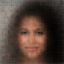

In [ ]:
# generate the data
generated = model.sample()

T.functional.to_pil_image(generated[0])

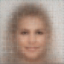

In [ ]:
T.functional.to_pil_image(generated[1])

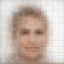

In [ ]:
T.functional.to_pil_image(generated[2])

creepy!


### Part 2 (15 points): 
Generative Adversarial Networks (GANs): Repeat part 1 (use same dataset) and implement a GAN model to generate high quality synthetic images. 
You may follow steps outlined here: https://www.tensorflow.org/tutorials/generative/dcgan


In [ ]:

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5


# referenced from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# Generator Code

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        # self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [ ]:
import torchvision.utils as vutils
from torch.optim import Adam
from tqdm.auto import tqdm

netG = Generator().cuda()
netG.apply(weights_init)

# Create the Discriminator
netD = Discriminator().cuda()
netD.apply(weights_init)

# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1).cuda()

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

for epoch in range(5):
    for i, imgs in enumerate(tqdm(train_loader,desc='one epoch.. ',leave=False)):
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        imgs = imgs.cuda()
        # real_cpu = data[0].to(device)
        b_size = imgs.size(0)
        label = torch.full((b_size,), real_label).float().cuda()
        # Forward pass real batch through D
        output = netD(imgs).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1).cuda()
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1


one epoch.. :   0%|          | 0/1272 [00:00<?, ?it/s]

[0/5][0/1272]	Loss_D: 1.8605	Loss_G: 1.9935	D(x): 0.2839	D(G(z)): 0.2664 / 0.1878
[0/5][50/1272]	Loss_D: 0.7917	Loss_G: 29.8262	D(x): 0.7354	D(G(z)): 0.0000 / 0.0000
[0/5][100/1272]	Loss_D: 1.9023	Loss_G: 15.6016	D(x): 0.9441	D(G(z)): 0.7587 / 0.0000
[0/5][150/1272]	Loss_D: 1.6470	Loss_G: 8.4467	D(x): 0.9526	D(G(z)): 0.7613 / 0.0006
[0/5][200/1272]	Loss_D: 1.0513	Loss_G: 2.0445	D(x): 0.5280	D(G(z)): 0.1818 / 0.1730
[0/5][250/1272]	Loss_D: 1.2485	Loss_G: 8.0301	D(x): 0.9318	D(G(z)): 0.6393 / 0.0018
[0/5][300/1272]	Loss_D: 0.5662	Loss_G: 1.9441	D(x): 0.7692	D(G(z)): 0.2086 / 0.1941
[0/5][350/1272]	Loss_D: 0.7000	Loss_G: 3.2719	D(x): 0.6358	D(G(z)): 0.0967 / 0.0618
[0/5][400/1272]	Loss_D: 0.9783	Loss_G: 5.2881	D(x): 0.8667	D(G(z)): 0.4855 / 0.0110
[0/5][450/1272]	Loss_D: 1.2988	Loss_G: 2.2534	D(x): 0.4103	D(G(z)): 0.0640 / 0.1696
[0/5][500/1272]	Loss_D: 0.7148	Loss_G: 6.2416	D(x): 0.8866	D(G(z)): 0.3899 / 0.0059
[0/5][550/1272]	Loss_D: 0.4575	Loss_G: 4.3400	D(x): 0.8181	D(G(z)): 0.1518 / 

one epoch.. :   0%|          | 0/1272 [00:00<?, ?it/s]

[1/5][0/1272]	Loss_D: 0.5054	Loss_G: 2.8346	D(x): 0.7531	D(G(z)): 0.1457 / 0.0870
[1/5][50/1272]	Loss_D: 0.5216	Loss_G: 4.7954	D(x): 0.8800	D(G(z)): 0.2888 / 0.0133
[1/5][100/1272]	Loss_D: 0.6892	Loss_G: 2.0763	D(x): 0.6023	D(G(z)): 0.0420 / 0.1762
[1/5][150/1272]	Loss_D: 1.4140	Loss_G: 1.0200	D(x): 0.3336	D(G(z)): 0.0152 / 0.4262
[1/5][200/1272]	Loss_D: 1.7653	Loss_G: 3.3167	D(x): 0.2929	D(G(z)): 0.0027 / 0.0603
[1/5][250/1272]	Loss_D: 0.9649	Loss_G: 4.5578	D(x): 0.4982	D(G(z)): 0.0108 / 0.0304
[1/5][300/1272]	Loss_D: 0.5352	Loss_G: 3.9458	D(x): 0.6797	D(G(z)): 0.0481 / 0.0409
[1/5][350/1272]	Loss_D: 0.6565	Loss_G: 4.6840	D(x): 0.8220	D(G(z)): 0.3196 / 0.0159
[1/5][400/1272]	Loss_D: 0.3239	Loss_G: 4.4042	D(x): 0.8533	D(G(z)): 0.1294 / 0.0208
[1/5][450/1272]	Loss_D: 0.4074	Loss_G: 3.3718	D(x): 0.8072	D(G(z)): 0.1324 / 0.0507
[1/5][500/1272]	Loss_D: 0.3708	Loss_G: 3.5791	D(x): 0.7931	D(G(z)): 0.0860 / 0.0507
[1/5][550/1272]	Loss_D: 0.5007	Loss_G: 3.4892	D(x): 0.8458	D(G(z)): 0.2421 / 0.

one epoch.. :   0%|          | 0/1272 [00:00<?, ?it/s]

[2/5][0/1272]	Loss_D: 0.4616	Loss_G: 3.8277	D(x): 0.8928	D(G(z)): 0.2594 / 0.0342
[2/5][50/1272]	Loss_D: 0.4575	Loss_G: 2.8899	D(x): 0.7521	D(G(z)): 0.1012 / 0.0896
[2/5][100/1272]	Loss_D: 0.4014	Loss_G: 3.5629	D(x): 0.8264	D(G(z)): 0.1471 / 0.0440
[2/5][150/1272]	Loss_D: 0.8569	Loss_G: 5.1792	D(x): 0.9216	D(G(z)): 0.4976 / 0.0099
[2/5][200/1272]	Loss_D: 0.6454	Loss_G: 4.0934	D(x): 0.9331	D(G(z)): 0.4031 / 0.0234
[2/5][250/1272]	Loss_D: 0.8916	Loss_G: 4.8694	D(x): 0.9537	D(G(z)): 0.5227 / 0.0112
[2/5][300/1272]	Loss_D: 0.5738	Loss_G: 4.0686	D(x): 0.8702	D(G(z)): 0.3250 / 0.0251
[2/5][350/1272]	Loss_D: 0.5353	Loss_G: 2.9028	D(x): 0.7748	D(G(z)): 0.1983 / 0.0729
[2/5][400/1272]	Loss_D: 0.6031	Loss_G: 2.8825	D(x): 0.7988	D(G(z)): 0.2736 / 0.0809
[2/5][450/1272]	Loss_D: 0.5576	Loss_G: 2.0890	D(x): 0.6935	D(G(z)): 0.1212 / 0.1575
[2/5][500/1272]	Loss_D: 0.5671	Loss_G: 4.1975	D(x): 0.9325	D(G(z)): 0.3544 / 0.0225
[2/5][550/1272]	Loss_D: 0.5009	Loss_G: 2.7062	D(x): 0.7911	D(G(z)): 0.1983 / 0.

one epoch.. :   0%|          | 0/1272 [00:00<?, ?it/s]

[3/5][0/1272]	Loss_D: 0.5507	Loss_G: 2.2915	D(x): 0.6843	D(G(z)): 0.1111 / 0.1328
[3/5][50/1272]	Loss_D: 0.5166	Loss_G: 2.9911	D(x): 0.8789	D(G(z)): 0.2899 / 0.0715
[3/5][100/1272]	Loss_D: 0.8124	Loss_G: 1.4277	D(x): 0.5600	D(G(z)): 0.1321 / 0.2882
[3/5][150/1272]	Loss_D: 0.4702	Loss_G: 2.7751	D(x): 0.7991	D(G(z)): 0.1931 / 0.0839
[3/5][200/1272]	Loss_D: 0.5337	Loss_G: 1.9779	D(x): 0.7270	D(G(z)): 0.1532 / 0.1628
[3/5][250/1272]	Loss_D: 1.0094	Loss_G: 4.7730	D(x): 0.9337	D(G(z)): 0.5627 / 0.0125
[3/5][300/1272]	Loss_D: 0.6159	Loss_G: 4.0732	D(x): 0.9252	D(G(z)): 0.3785 / 0.0244
[3/5][350/1272]	Loss_D: 0.3950	Loss_G: 2.3534	D(x): 0.8110	D(G(z)): 0.1457 / 0.1261
[3/5][400/1272]	Loss_D: 0.5049	Loss_G: 3.1532	D(x): 0.8500	D(G(z)): 0.2615 / 0.0617
[3/5][450/1272]	Loss_D: 0.7733	Loss_G: 3.3229	D(x): 0.8937	D(G(z)): 0.4310 / 0.0505
[3/5][500/1272]	Loss_D: 0.5071	Loss_G: 1.9969	D(x): 0.7460	D(G(z)): 0.1557 / 0.1756
[3/5][550/1272]	Loss_D: 0.7064	Loss_G: 2.6311	D(x): 0.8589	D(G(z)): 0.3866 / 0.

one epoch.. :   0%|          | 0/1272 [00:00<?, ?it/s]

[4/5][0/1272]	Loss_D: 0.5563	Loss_G: 1.4191	D(x): 0.6891	D(G(z)): 0.1316 / 0.2831
[4/5][50/1272]	Loss_D: 0.4928	Loss_G: 2.2868	D(x): 0.7768	D(G(z)): 0.1844 / 0.1231
[4/5][100/1272]	Loss_D: 0.4051	Loss_G: 2.1971	D(x): 0.7994	D(G(z)): 0.1401 / 0.1386
[4/5][150/1272]	Loss_D: 0.6657	Loss_G: 3.7153	D(x): 0.8752	D(G(z)): 0.3766 / 0.0359
[4/5][200/1272]	Loss_D: 0.5993	Loss_G: 2.3143	D(x): 0.7694	D(G(z)): 0.2435 / 0.1315
[4/5][250/1272]	Loss_D: 0.5009	Loss_G: 2.1396	D(x): 0.7655	D(G(z)): 0.1799 / 0.1436
[4/5][300/1272]	Loss_D: 1.0381	Loss_G: 3.8490	D(x): 0.9352	D(G(z)): 0.5587 / 0.0345
[4/5][350/1272]	Loss_D: 0.3708	Loss_G: 2.5981	D(x): 0.8475	D(G(z)): 0.1641 / 0.1024
[4/5][400/1272]	Loss_D: 0.7936	Loss_G: 1.9915	D(x): 0.6590	D(G(z)): 0.2520 / 0.1741
[4/5][450/1272]	Loss_D: 0.5585	Loss_G: 2.6265	D(x): 0.7392	D(G(z)): 0.1904 / 0.0994
[4/5][500/1272]	Loss_D: 0.4593	Loss_G: 3.7070	D(x): 0.8877	D(G(z)): 0.2648 / 0.0343
[4/5][550/1272]	Loss_D: 0.8001	Loss_G: 4.6004	D(x): 0.9321	D(G(z)): 0.4719 / 0.

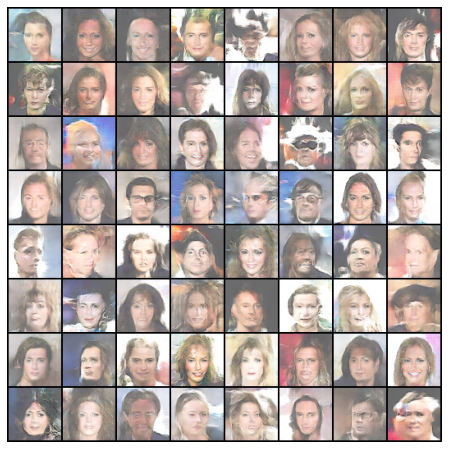

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())











### Project Progress Report (This is not graded)
Please submit a report detailing your progress on the final project. This can be a 1 (maximum 2)
page long description of your data-collection/modelling/preliminary results related tasks. Also,
describe the next steps towards your final goal.

I have started to examine the dataset by constructing the graph network and examining the features. The graph data is a bit too large to visualize, I will try to find a way to do this for the final report. And I am currently working on implementing the GCN networks that were used to test on the dataset by the original authors. I would like to use the GCN as my baseline, and then move onto implementing GAT once I finish with the GCN.

The dataset contains 3 csv files.
- classes
- edge list
- node features

And it appears that the dataset has 203,769 nodes and 234,355 edges. 4545 of the nodes are labelled class1 (illicit transaction) while the rest are labled 0. 

The data also contains timestamp data and other 166 features, which I have yet to examine what they exactly mean. I am planning on referencing the original paper to get an idea of how to use these feature values and which ones I should ignore.

For the implementation, I am using pytorch and torch_geometric package for the GNN implementations. I am using this framework because I have worked a bit with in the past and am familiar with it.

My goal for the next checkpoint is to be done with the baseline model (GCN) so that I can move onto working on the GAT model. 
